In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from tensorflow.keras.applications import vgg16

from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras import Sequential, optimizers

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img

import random
import os

%matplotlib inline

In [ ]:
# settings for reproducibility
seed = 42
random.seed(seed)
tf.random.set_seed(seed)
np.random.seed(seed)
os.environ['TF_DETERMINISTIC_OPS'] = '1'

is_use_gpu = True
if is_use_gpu:
    gpu_devices = tf.config.list_physical_devices('GPU')
    tf.config.experimental.set_visible_devices(gpu_devices[0], 'GPU')
    tf.config.experimental.set_memory_growth(gpu_devices[0], True)
    os.environ['TF_USE_CUDNN'] = '1'
else:
    os.environ["CUDA_VISIBLE_DEVICES"] ="-1"

In [ ]:
# each folder contains three subfolders in accordance with the number of classes


train_dir = '/content/drive/MyDrive/Colab Notebooks/Learning/handsOn/Keras-Fine-Tuning/clean-dataset/train'
validation_dir = '/content/drive/MyDrive/Colab Notebooks/Learning/handsOn/Keras-Fine-Tuning/clean-dataset/validation'

image_size = 224

# Experiment 1: Freezing all layers - Same as Transfer Learning

<h3>1. Freezing all layers</h3>


In [ ]:
vgg_conv = vgg16.VGG16(weights='imagenet',include_top=False,input_shape=(image_size,image_size,3))

for layer in vgg_conv.layers[:]:
  layer.trainable = False

for layer in vgg_conv.layers:
  print(layer,layer.trainable)

58892288/58889256 [==============================] - 0s 0us/step
<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7f62be846390> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f62bae04c90> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f628762c650> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f627017acd0> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f627018af90> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f627017ad90> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f6270195e50> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f627019ef90> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f627019a590> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f6270123fd0> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f627012bf90> Fals

In [ ]:
for layer in vgg_conv.layers[:-4]:
  print(layer,layer.trainable)

<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7f62be846390> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f62bae04c90> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f628762c650> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f627017acd0> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f627018af90> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f627017ad90> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f6270195e50> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f627019ef90> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f627019a590> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f6270123fd0> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f627012bf90> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 

In [ ]:
model = Sequential()
model.add(vgg_conv)

model.add(Flatten())
model.add(Dense(1024,activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(3,activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten (Flatten)            (None, 25088)             0         
_________________________________________________________________
dense (Dense)                (None, 1024)              25691136  
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 3075      
Total params: 40,408,899
Trainable params: 25,694,211
Non-trainable params: 14,714,688
_________________________________________________________________


<h3>2. Prepare the training and validation data</h3>

In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_batchsize = 100
val_batchsize =10

train_generator = train_datagen.flow_from_directory( train_dir,
                                                    target_size = (image_size,image_size),
                                                    batch_size = train_batchsize,
                                                    class_mode = 'categorical'
                                                      )

validation_generator = validation_datagen.flow_from_directory( validation_dir,
                                                        target_size = (image_size,image_size),
                                                        batch_size = val_batchsize,
                                                        class_mode = 'categorical',shuffle=False
                                                             )

Found 603 images belonging to 3 classes.
Found 150 images belonging to 3 classes.


In [ ]:
def get_class_name(generator, image_id):
    # Get the image class and map its index with the names of the classes
    image_label_id = np.argmax(generator[image_id][1][0])
    classes_list = list(generator.class_indices.keys())
    return classes_list[image_label_id]

The shape of the Train images : (224, 224, 3)
The shape of the Validation images : (224, 224, 3)


Text(0.5, 1.0, 'Validation class name: tomato')

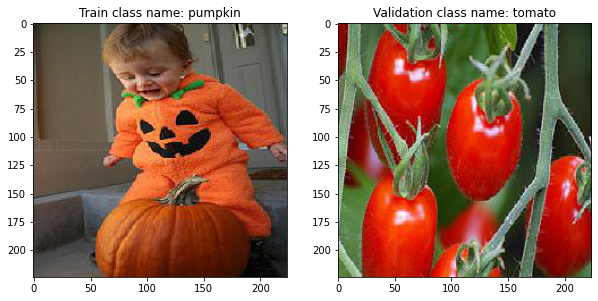

In [ ]:
image_id = 5

print("The shape of the Train images : {}".format(train_generator[image_id][0][0].shape))
print("The shape of the Validation images : {}".format(validation_generator[image_id][0][0].shape))

plt.figure(figsize=[10,5])
plt.subplot(121)
plt.imshow(train_generator[image_id][0][0])

plt.title("Train class name: {}".format(get_class_name(train_generator,image_id)))

plt.subplot(122)
plt.imshow(validation_generator[image_id][0][0])

plt.title("Validation class name: {}".format(get_class_name(validation_generator,image_id)))


In [ ]:
model.compile(loss="categorical_crossentropy",
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

history = model.fit(
                    train_generator,
                    steps_per_epoch = train_generator.samples / train_generator.batch_size,
                    epochs = 20,
                    validation_data = validation_generator,
                    validation_steps = validation_generator.samples / validation_generator.batch_size,
                    verbose = 1)

model.save('mytry_all_freezed.h5')

loss,accuracy = model.predict_generator(validation_generator)

print("Test: accuracy = %f ; loss =%f " %(accuracy, loss))
                    

Epoch 1/20
6/6 [==============================] - 138s 15s/step - loss: 3.5877 - acc: 0.4064 - val_loss: 1.3391 - val_acc: 0.5333
Epoch 2/20
6/6 [==============================] - 6s 1s/step - loss: 1.0689 - acc: 0.5902 - val_loss: 0.7988 - val_acc: 0.6933
Epoch 3/20
6/6 [==============================] - 6s 1s/step - loss: 0.5517 - acc: 0.7733 - val_loss: 0.4661 - val_acc: 0.8200
Epoch 4/20
6/6 [==============================] - 7s 1s/step - loss: 0.2544 - acc: 0.9003 - val_loss: 0.7443 - val_acc: 0.6733
Epoch 5/20
6/6 [==============================] - 6s 1s/step - loss: 0.2497 - acc: 0.9038 - val_loss: 0.4254 - val_acc: 0.8400
Epoch 6/20
6/6 [==============================] - 7s 1s/step - loss: 0.1753 - acc: 0.9364 - val_loss: 1.5966 - val_acc: 0.6133
Epoch 7/20
6/6 [==============================] - 7s 1s/step - loss: 0.5621 - acc: 0.8039 - val_loss: 0.3528 - val_acc: 0.8667
Epoch 8/20
6/6 [==============================] - 7s 1s/step - loss: 0.0834 - acc: 0.9816 - val_loss: 0.5063

In [ ]:
# Utility function for plotting of the model results
def visualize_results(history):
    # Plot the accuracy and loss curves
    acc = history.history['acc']
    val_acc = history.history['val_acc']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    plt.plot(epochs, acc, 'b', label='Training acc')
    plt.plot(epochs, val_acc, 'r', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()

    plt.figure()

    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.show()


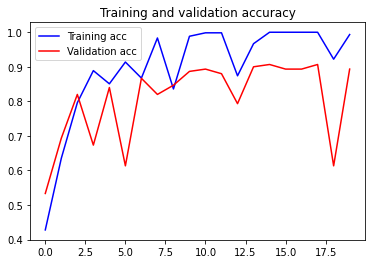

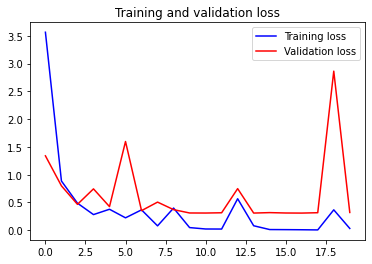

In [ ]:
visualize_results(history)

In [ ]:
# Utility function for obtaining of the errors 
def obtain_errors(val_generator, predictions):
    # Get the filenames from the generator
    fnames = validation_generator.filenames

    # Get the ground truth from generator
    ground_truth = validation_generator.classes

    # Get the dictionary of classes
    label2index = validation_generator.class_indices

    # Obtain the list of the classes
    idx2label = list(label2index.keys())
    print("The list of classes: ", idx2label)

    # Get the class index
    predicted_classes = np.argmax(predictions, axis=1)

    errors = np.where(predicted_classes != ground_truth)[0]
    print("Number of errors = {}/{}".format(len(errors),validation_generator.samples))
    
    return idx2label, errors, fnames

In [ ]:
# Utility function for visualization of the errors
def show_errors(idx2label, errors, predictions, fnames):
    # Show the errors
    for i in range(len(errors)):
        pred_class = np.argmax(predictions[errors[i]])
        pred_label = idx2label[pred_class]

        title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
            fnames[errors[i]].split('/')[0],
            pred_label,
            predictions[errors[i]][pred_class])

        original = load_img('{}/{}'.format(validation_dir,fnames[errors[i]]))
        plt.figure(figsize=[7,7])
        plt.axis('off')
        plt.title(title)
        plt.imshow(original)
        plt.show()

15/15 [==============================] - 2s 94ms/step
The list of classes:  ['pumpkin', 'tomato', 'watermelon']
Number of errors = 16/150


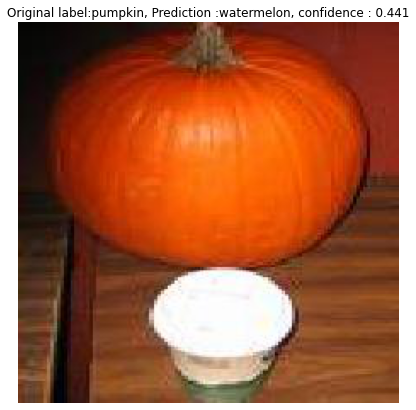

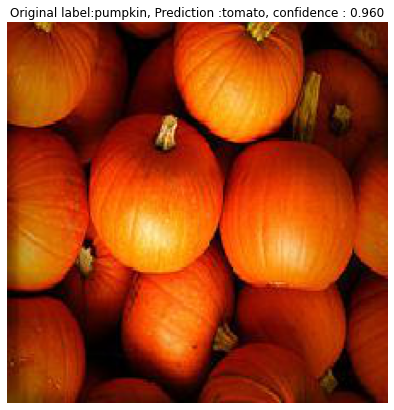

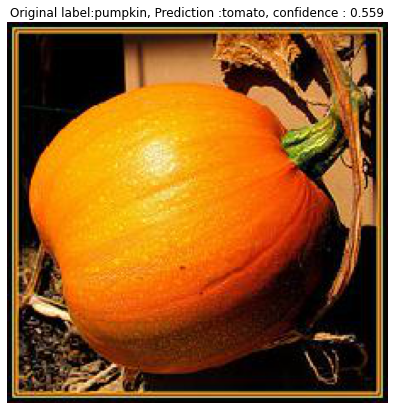

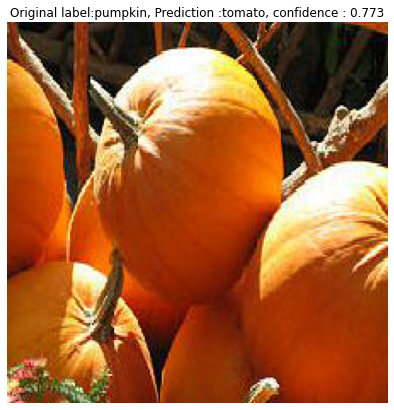

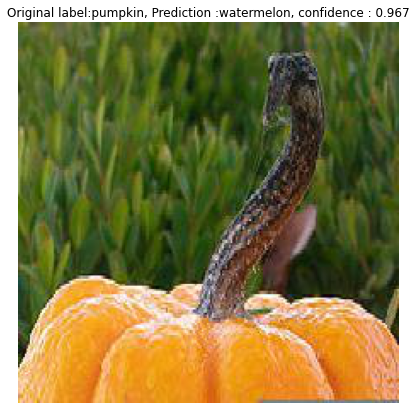

...

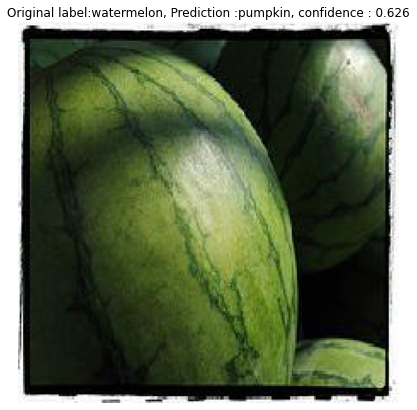

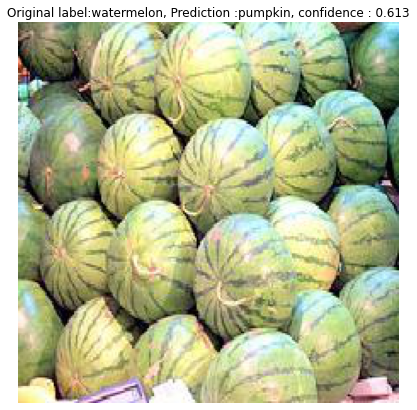

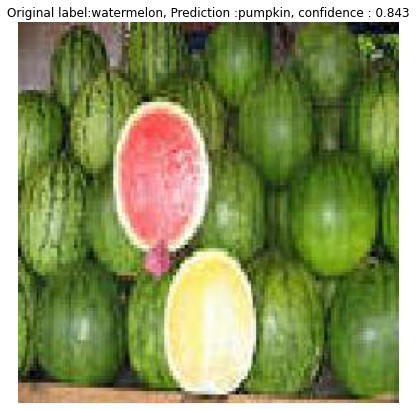

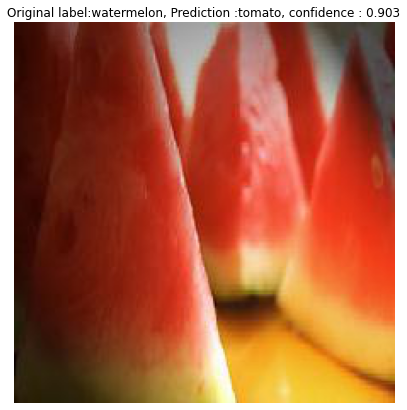

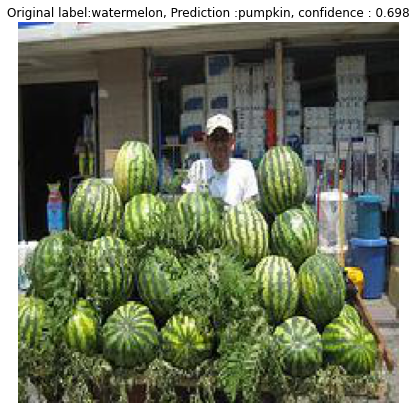

In [ ]:
# Get the predictions from the model using the generator
predictions = model.predict(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)

# Run the function to get the list of classes and errors
idx2label, errors, fnames = obtain_errors(validation_generator, predictions)

# Run the function to illustrate the error cases
show_errors(idx2label, errors, predictions, fnames)

# Experiment 2: Freezing all layers - Same as Transfer Learning and with data augmentation

In [ ]:
# generate batches of train transformed images and labels
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=20,
      width_shift_range=0.2,
      height_shift_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

validation_datagen = ImageDataGenerator(rescale=1./255)

# Change the batchsize according to your system RAM
train_batchsize = 50
val_batchsize = 10

# Data generator for training data
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical')

# Data generator for validation data
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

Found 603 images belonging to 3 classes.
Found 150 images belonging to 3 classes.


Epoch 1/40
12/12 [==============================] - 15s 838ms/step - loss: 1.4231 - acc: 0.7229 - val_loss: 0.4028 - val_acc: 0.8600
Epoch 2/40
12/12 [==============================] - 10s 852ms/step - loss: 0.2533 - acc: 0.8874 - val_loss: 0.2919 - val_acc: 0.9067
Epoch 3/40
12/12 [==============================] - 10s 849ms/step - loss: 0.2342 - acc: 0.9141 - val_loss: 0.3358 - val_acc: 0.9133
Epoch 4/40
12/12 [==============================] - 10s 831ms/step - loss: 0.2606 - acc: 0.8972 - val_loss: 0.2813 - val_acc: 0.9333
Epoch 5/40
12/12 [==============================] - 10s 851ms/step - loss: 0.2191 - acc: 0.9231 - val_loss: 0.5639 - val_acc: 0.8467
Epoch 6/40
12/12 [==============================] - 10s 853ms/step - loss: 0.3916 - acc: 0.8663 - val_loss: 0.3920 - val_acc: 0.9067
Epoch 7/40
12/12 [==============================] - 10s 847ms/step - loss: 0.2078 - acc: 0.9237 - val_loss: 0.2597 - val_acc: 0.9333
Epoch 8/40
12/12 [==============================] - 10s 853ms/step - 

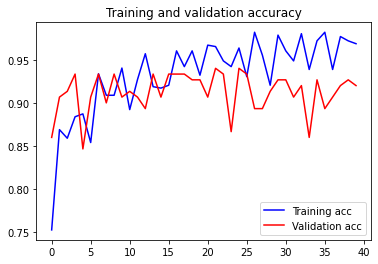

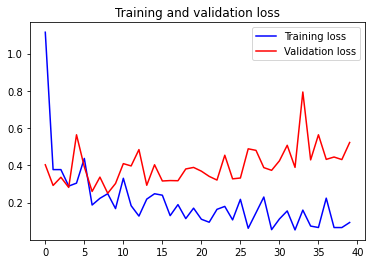

In [ ]:
# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# Train the model
history = model.fit(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size,
      epochs=40,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)

# Save the model
model.save('da_last4_layers.h5')

# Run the function to illustrate accuracy and loss
visualize_results(history)

15/15 [==============================] - 1s 96ms/step
The list of classes:  ['pumpkin', 'tomato', 'watermelon']
Number of errors = 10/150


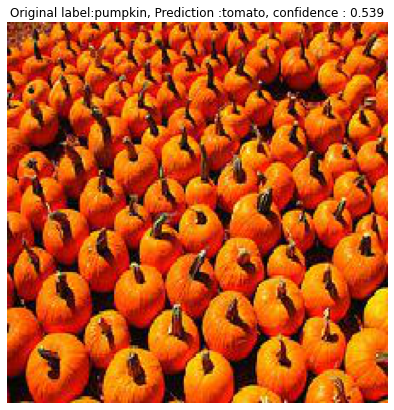

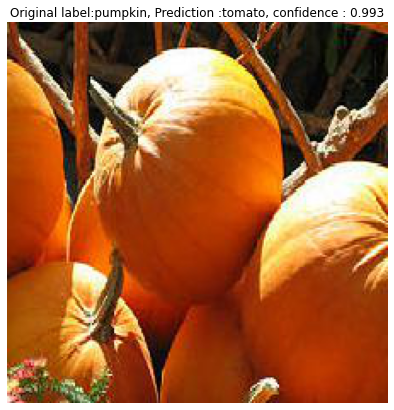

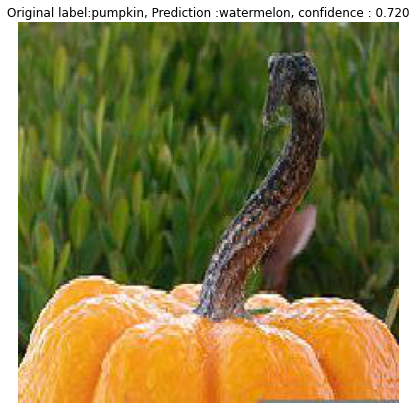

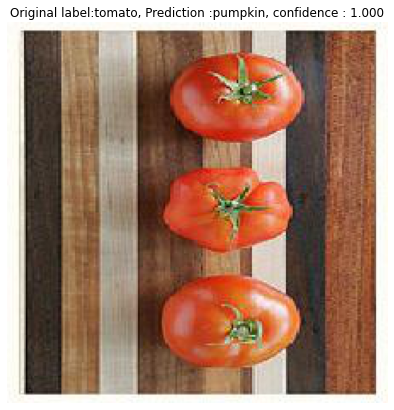

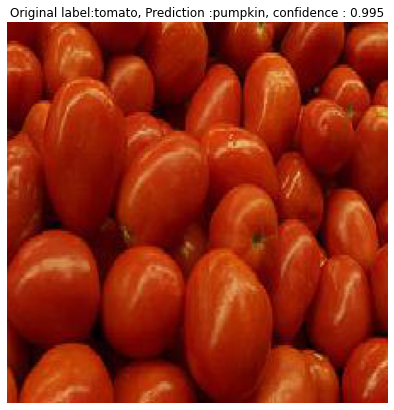

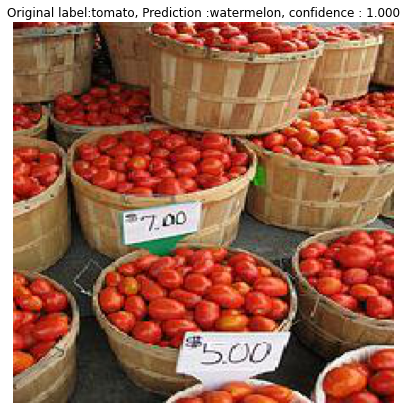

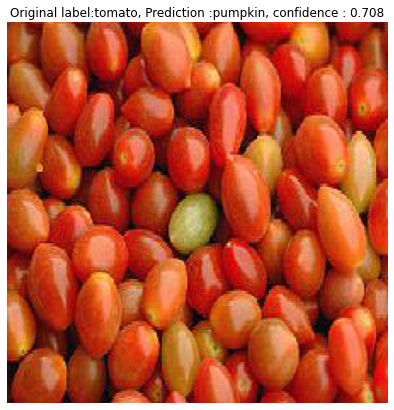

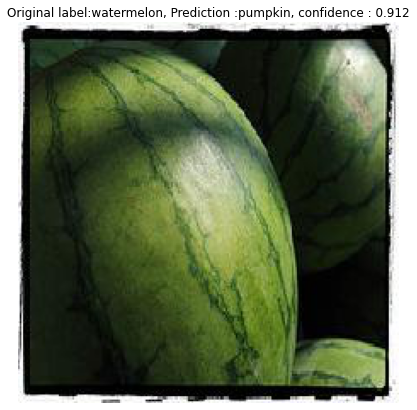

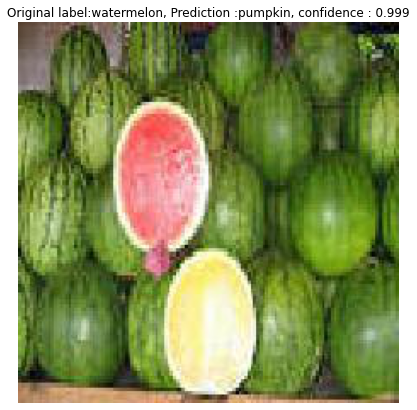

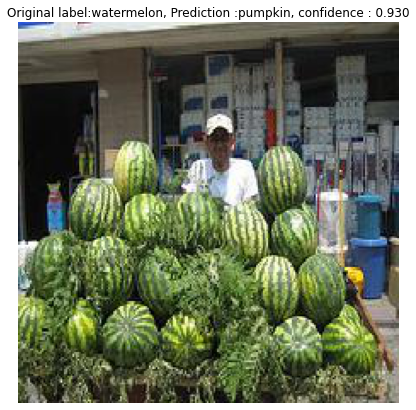

In [ ]:
# Get the predictions from the model using the generator
predictions = model.predict(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)

# Run the function to get the list of classes and errors
idx2label, errors, fnames = obtain_errors(validation_generator, predictions)

# Run the function to illustrate the error cases
show_errors(idx2label, errors, predictions, fnames)

# Experiment 3 :  Freezing all layers - Same as Transfer Learning and with data augmentation Fit Generator

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/40
12/12 [==============================] - 11s 832ms/step - loss: 0.2083 - acc: 0.9423 - val_loss: 0.6589 - val_acc: 0.9400
Epoch 2/40
12/12 [==============================] - 10s 819ms/step - loss: 0.0128 - acc: 0.9953 - val_loss: 0.7060 - val_acc: 0.9200
Epoch 3/40
12/12 [==============================] - 10s 873ms/step - loss: 0.0216 - acc: 0.9946 - val_loss: 0.6553 - val_acc: 0.9333
Epoch 4/40
12/12 [==============================] - 10s 819ms/step - loss: 0.0241 - acc: 0.9900 - val_loss: 0.6332 - val_acc: 0.9333
Epoch 5/40
12/12 [==============================] - 10s 817ms/step - loss: 0.0453 - acc: 0.9836 - val_loss: 0.6500 - val_acc: 0.9200
Epoch 6/40
12/12 [==============================] - 10s 879ms/step - loss: 0.0354 - acc: 0.9866 - val_loss: 0.6637 - val_acc: 0.9267
Epoch 7/40
12/12 [==============================] - 10s 824ms/step - loss: 0.0023 - acc: 0.9990 - val_loss: 0.7026 - val_acc: 0.9200
Epoch 8/40
12/12 [==============================] - 10s 824ms/step - 

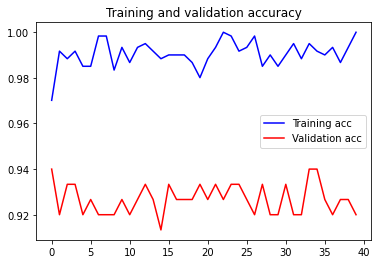

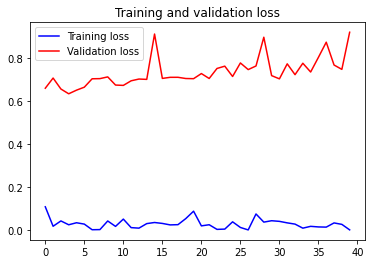

In [ ]:
# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# Train the model
history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size,
      epochs=40,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)

# Save the model
model.save('da_last4_layers.h5')


# Run the function to illustrate accuracy and loss
visualize_results(history)

15/15 [==============================] - 1s 90ms/step
The list of classes:  ['pumpkin', 'tomato', 'watermelon']
Number of errors = 10/150


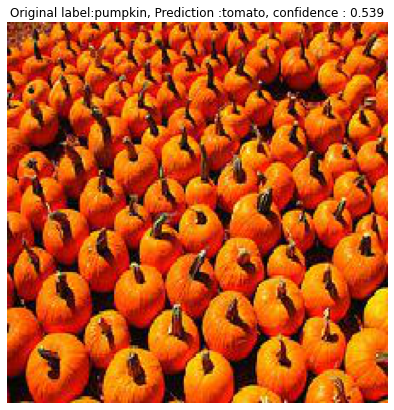

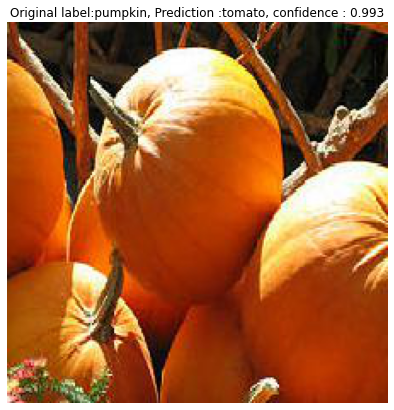

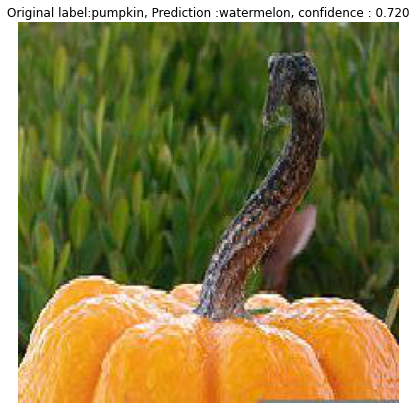

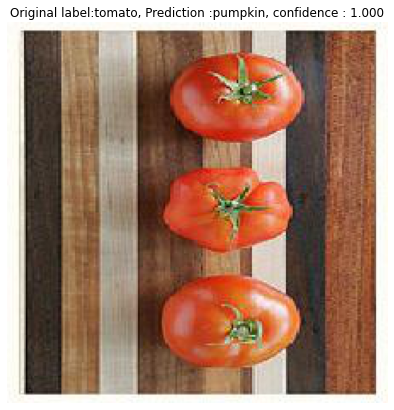

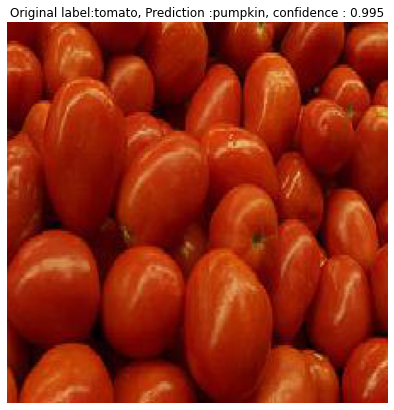

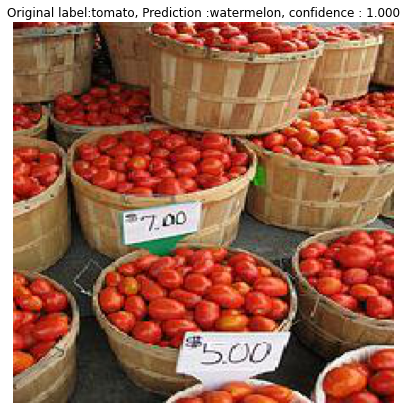

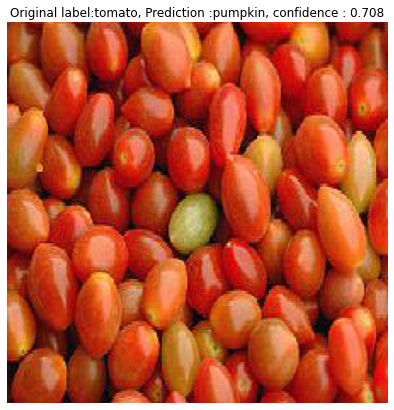

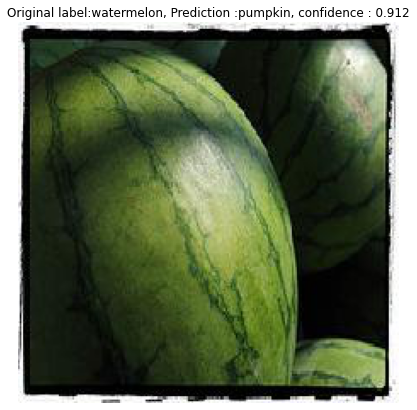

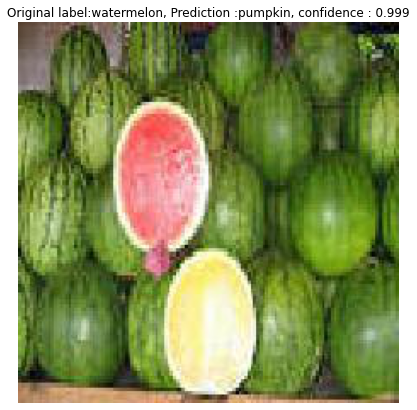

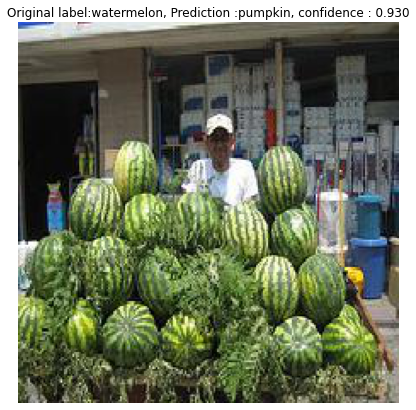

In [ ]:
# Get the predictions from the model using the generator
predictions = model.predict(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)

# Run the function to get the list of classes and errors
idx2label, errors, fnames = obtain_errors(validation_generator, predictions)

# Run the function to illustrate the error cases
show_errors(idx2label, errors, predictions, fnames)

In [ ]:
# Save the model
model.save('da_last4_layers.h5')

# Load Model

In [ ]:
from tensorflow.keras.models import load_model
import cv2
import numpy as np

In [ ]:
model = load_model("/content/drive/MyDrive/Colab Notebooks/da_last4_layers.h5")

In [ ]:
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['acc'])

In [ ]:
/content/drive/MyDrive/Colab Notebooks/Learning/handsOn/tomato.jpg

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Learning/handsOn/tomato.jpg')
img = cv2.resize(img,(224,224))
img = np.reshape(img,[1,224,224,3])


In [ ]:
classes_names = ['pumpkin','tomato', 'watermelon']
classes = np.argmax(model.predict(img), axis = -1)
print(classes)

[1]


In [ ]:
for i in classes:
  print(classes_names[i])



tomato


In [ ]:
idx2label = {0: 'pumpkin', 1: 'tomato', 2: 'watermelon'}


# get the predicted probabilities for each class
predictions = model.predict(img)
print (predictions)
# convert the probabilities to class labels
predicted_classes = np.argmax(predictions,axis=1)
print(predicted_classes)
pred_class = np.argmax(predictions[0])
print("Predicted class:",pred_class)
pred_label = idx2label[pred_class]
print("Predicted label:",pred_label)
conf =predictions[0][pred_class]
print("Confidence : {:.3f}".format(conf))

[[0. 1. 0.]]
[1]
Predicted class: 1
Predicted label: tomato
Confidence : 1.000
